In [1]:
import jax
import jax.numpy as np
from jax import jit, grad, random
from jax.experimental import stax, optimizers

import matplotlib.pyplot as plt
from tqdm.notebook import tqdm as tqdm
import os, imageio
import numpy

rand_key = random.PRNGKey(5)

### Jack Danner
### 5/16/2021

# Fourier feature mapping for upsampling

For this project I wanted to explore upscaling 2D images/renders with sparse data. The application I have in mind specifically is motivated by the expense of sampling rays in computer graphics. As discussed, there are certain areas of scenes where it is worth shooting more rays, mainly around hard edges or detailed textures. This project is inspired by Tancik's fourier feature mapping paper and uses some of [Tancik's code](https://github.com/tancik/fourier-feature-networks/blob/master/Demo.ipynb). I have built an adaptive sampler informed by RMSE of a fourier feature mapping at various stages of it's training. I took this idea and ran with it in a few directions. 

## Multi-scale
The first adaptive sampler takes in a "scale" parameter and divides the image into blocks in screen space. The amount of pixels (or rays) sampled in a block is weighted by the training model's current RMSE for the samples of that block. In other words, the training data is added at each scale during a "sampling pass" using a CNN with fourier feature mapping for input pixels. My hypothesis was that as the model is trained on new samples that are targeted at high error blocks on multiple levels, it would provide a set of samples better at reconstructing detail in images. Upon reflection this type of subdivided sampling most definitley exists already, so if there are any papers or existing algorithms that already do this I would be interested. One thing to note is that the total samples must be divided among the scales evenly. The first scale will sample the entire image, the second will sample each quadrant of the image, and so on. I tried evenly dividing my total samples between scales, and distributing them in an exponential fashion where the last scale recieves the majority. Both methods had strengths and weaknesses that I will try to show.

## Single-scale
I then made a second version of this sampler that uses only 1 scale. First, it subdivides the image based on scale input. I tested it on scale 64 and 128, where the image is divided into grids of those sizes respectfully. A small amount of samples (only one when I tested) are chosen in each block in the grid, and a CNN is trained with a fourier feature mapping on just those initial samples. Next, the error of each block is used to weight the remaining samples. 

## Comparison
Both of these models are used only for sample selection. The training data accumulated is passed to another CNN where it is trained for 2000 iterations. I did this because since I am introducing new samples in my multi-scale training, the most important samples are being introduced lasted an may only see a few iterations compared to the rest. My hypothesis was that a multi-scale approach would give a 'smoother' sample distribution with less blocky edges due to the subdivision. I then created the single-scale version to test whether or not this subdivision is necessary or if I can just direction subdivide the image and the error weights would smooth things out regardless. Both of these sampling methods were compared to a normally distributed random sampling method that draws sample from the full screen.

## Why I used Images 
Initially I wanted to test this with a ray tracer, and I do use ray traced images. However I have never built a path/ray tracer in python and I had to dig to find one, and that is probably for a good reason. One of the renders I use in the project is made from a python ray tracer, but it is quite simplistic yet still extremely slow. 

To make my life a bit easier, I decided to go ahead and use images instead of linking my sampler with a ray tracer. My sampler chooses samples from a viewplane of range (0,1)x(0,1), so it is still similar to sampling through individual pixels on a viewplane, but only contains one value. However, I think that a fourier feature mapping of 3D ray might provide different results compared to a 2D ray, and there is still technically potential for sampling a pixel multiple times in small blocks since we aren't intersecting geometry. Nevertheless, I think that the advantages of such a sampler even on images is apparent in my experiment.

# Training/Misc functions

In [2]:
# Fourier feature mapping
def input_mapping(x, B): 
    if B is None:
        return x
    else:
        x_proj = (2.*np.pi*x) @ B.T
        return np.concatenate([np.sin(x_proj), np.cos(x_proj)], axis=-1)


# JAX network definition
def make_network(num_layers, num_channels):
    layers = []
    for i in range(num_layers-1):
        layers.append(stax.Dense(num_channels))
        layers.append(stax.Relu)
    layers.append(stax.Dense(3))
    layers.append(stax.Sigmoid)
    return stax.serial(*layers)

In [3]:
def train_final(network_size, learning_rate, iters, B, test_data, train_data):

    init_fn, apply_fn = make_network(*network_size)

    model_pred = jit(lambda params, x: apply_fn(params, input_mapping(x, B)))
    model_loss = jit(lambda params, x, y: np.mean((model_pred(params, x) - y) ** 2))
    model_rmse = jit(lambda params, x, y: np.sqrt(model_loss(params, x, y)))
    model_grad_loss = jit(lambda params, x, y: jax.grad(model_loss)(params, x, y))

    opt_init, opt_update, get_params = optimizers.adam(learning_rate)
    opt_update = jit(opt_update)
    
    _, params = init_fn(rand_key, (-1, input_mapping(train_data[0], B).shape[-1]))
    opt_state = opt_init(params)
    
    for i in tqdm(range(iters), desc='train iter', leave=False):
            
        opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *train_data), opt_state)

    train_rmse = model_rmse(get_params(opt_state), *train_data)
    test_rmse = model_rmse(get_params(opt_state), *test_data)
    pred_img = model_pred(get_params(opt_state), test_data[0])
    
    return [train_rmse, test_rmse, pred_img]


def train_no_scale(network_size, learning_rate, iterations, B, test_data, total_samples):

    init_fn, apply_fn = make_network(*network_size)
    img = test_data[1]

    model_pred = jit(lambda params, x: apply_fn(params, input_mapping(x, B)))
    model_loss = jit(lambda params, x, y: np.mean((model_pred(params, x) - y) ** 2))
    model_rmse = jit(lambda params, x, y: np.sqrt(model_loss(params, x, y)))
    model_grad_loss = jit(lambda params, x, y: jax.grad(model_loss)(params, x, y))

    opt_init, opt_update, get_params = optimizers.adam(learning_rate)
    opt_update = jit(opt_update)
    
    sampleImage = numpy.zeros((img.shape[0], img.shape[0], 3))
    train_data, sampleImage = get_samples(test_data[1], 1, 0, 0, total_samples, sampleImage)

    
    
    _, params = init_fn(rand_key, (-1, input_mapping(train_data[0], B).shape[-1]))
    opt_state = opt_init(params)
    
    for i in tqdm(range(iterations), desc='train iter', leave=False):
        opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *train_data), opt_state)
        
    print("Random Sampling, no scale")
    plot_samples(sampleImage,train_data[0].shape[0],8)
    train_rmse = model_rmse(get_params(opt_state), *train_data)
    test_rmse = model_rmse(get_params(opt_state), *test_data)
    pred_img = model_pred(get_params(opt_state), test_data[0])

    return [train_rmse, test_rmse, pred_img]


def train_experimental(network_size, learning_rate, iter_per_scale, B, test_data, total_samples, scales, even_dist=True):

    init_fn, apply_fn = make_network(*network_size)

    model_pred = jit(lambda params, x: apply_fn(params, input_mapping(x, B)))
    model_loss = jit(lambda params, x, y: np.mean((model_pred(params, x) - y) ** 2))
    model_rmse = jit(lambda params, x, y: np.sqrt(model_loss(params, x, y)))
    model_grad_loss = jit(lambda params, x, y: jax.grad(model_loss)(params, x, y))
    #model_block_loss = jit(lambda params, x, y: np.absolute(np.mean((model_pred(params, x) - y)))*1000)
    img = test_data[1]

    opt_init, opt_update, get_params = optimizers.adam(learning_rate)
    opt_update = jit(opt_update)
    
    sampleImage = numpy.zeros((img.shape[0], img.shape[0], 3))
    if (even_dist):
        sample_distrib = numpy.ones(scales)*int(total_samples/scales)
    else:
        sample_distrib = numpy.zeros(scales)
        for x in range(scales):
            sample_distrib[x] = 2**x
        sample_distrib = (sample_distrib/numpy.sum(sample_distrib))*total_samples

    print("sample distrib:", sample_distrib )
    
    #initial training data, sample from whole image
    split = 2**1
    train_data = []
    sampleBlocks = []
    for bx in range(2):
        sampleBlocks.append([])
        for by in range(2):
            new_train, sampleImage = get_samples(test_data[1], 2, bx, by, int(sample_distrib[0]/(2*2)), sampleImage)
            sampleBlocks[bx].append(new_train)
            if (len(train_data) == 0):
                train_data = new_train
            else:
                train_data = [numpy.append(train_data[0],new_train[0],axis=0), numpy.append(train_data[1],new_train[1],axis=0)]
    
        
    _, params = init_fn(rand_key, (-1, input_mapping(train_data[0], B).shape[-1]))
    opt_state = opt_init(params)
    
    for i in tqdm(range(iter_per_scale*scales+iter_per_scale), desc='train iter', leave=False):
        if (i%iter_per_scale == 0 and i != 0):
            if (int((i/iter_per_scale)) == scales):
                break
            prev_scale = 2**(int((i/iter_per_scale)))
            block_errs = numpy.zeros((prev_scale,prev_scale))
            errorImage = numpy.zeros((img.shape[0], img.shape[0]))
            for bx in range(prev_scale):
                for by in range(prev_scale):
                    if len(sampleBlocks[bx][by][0]) == 0:
                        block_rmse = 0
                    else:
                        block_rmse = model_rmse(get_params(opt_state), *sampleBlocks[bx][by])
                    if (numpy.isnan(block_rmse)):
                        print("Nan cause;", sampleBlocks[bx][by])
                    errorImage = set_rmse(block_rmse, prev_scale, bx, by, errorImage)
                    block_errs[bx][by] = block_rmse
            #print("Block_errs:", block_errs)
            block_errs = block_errs/numpy.sum(block_errs)
            #print("Block_errs:", block_errs)
            block_samples = block_errs*sample_distrib[int((i/iter_per_scale))]
            pred_img = model_pred(get_params(opt_state), test_data[0])
            plot_imgs(pred_img, sampleImage, errorImage, prev_scale)
            scale = 2**(int((i/iter_per_scale))+1)
            sampleBlocks = []
            for bx in range(scale):
                sampleBlocks.append([])
                for by in range(scale):
                    new_train, sampleImage = get_samples(test_data[1], scale, bx, by, 
                                                         int(int(block_samples[int(bx*prev_scale/scale)][int(by*prev_scale/scale)])/4), sampleImage)
                    sampleBlocks[bx].append(new_train)
                    train_data = [numpy.append(train_data[0],new_train[0],axis=0), numpy.append(train_data[1],new_train[1],axis=0)]
                        
            print("Current iteration: ",i,"Current scale: ",scale)
            print("Number of samples: ", train_data[0].shape[0])
            
        opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *train_data), opt_state)
    
    plot_samples(sampleImage,train_data[0].shape[0], 16)
    train_rmse = model_rmse(get_params(opt_state), *train_data)
    test_rmse = model_rmse(get_params(opt_state), *test_data)
    pred_img = model_pred(get_params(opt_state), test_data[0])

    return [train_rmse, test_rmse, pred_img, train_data]





def train_single_pass(network_size, learning_rate, iterations, B, test_data, total_samples, scale, ratio):

    init_fn, apply_fn = make_network(*network_size)

    model_pred = jit(lambda params, x: apply_fn(params, input_mapping(x, B)))
    model_loss = jit(lambda params, x, y: np.mean((model_pred(params, x) - y) ** 2))
    model_rmse = jit(lambda params, x, y: np.sqrt(model_loss(params, x, y)))
    model_grad_loss = jit(lambda params, x, y: jax.grad(model_loss)(params, x, y))
    
    
    opt_init, opt_update, get_params = optimizers.adam(learning_rate)
    opt_update = jit(opt_update)
    img = test_data[1]
    
    sampleImage = numpy.zeros((img.shape[0], img.shape[0], 3))
    train_data = []
    sampleBlocks = []
    for bx in range(scale):
        sampleBlocks.append([])
        for by in range(scale):
            new_train, sampleImage = get_samples(test_data[1], scale, bx, by, 1, sampleImage)
            sampleBlocks[bx].append(new_train)
            if (len(train_data) == 0):
                train_data = new_train
            else:
                train_data = [numpy.append(train_data[0],new_train[0],axis=0), numpy.append(train_data[1],new_train[1],axis=0)]
    print("train data: ", train_data[0].shape[0])
    
            
            

    _, params = init_fn(rand_key, (-1, input_mapping(train_data[0], B).shape[-1]))
    opt_state = opt_init(params)
    
    for i in tqdm(range(iterations), desc='train iter', leave=False):
        opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *train_data), opt_state)
        
    block_errs = numpy.zeros((scale,scale))
    errorImage = numpy.zeros((test_data[1].shape[0], test_data[1].shape[0]))
    for bx in range(scale):
        for by in range(scale):
            block_rmse = model_rmse(get_params(opt_state), *sampleBlocks[bx][by])
            #if (numpy.isnan(block_rmse)):
            #    block_rmse = 0
            errorImage = set_rmse(block_rmse, scale, bx, by, errorImage)
            block_errs[bx][by] = block_rmse

    block_errs = block_errs/numpy.sum(block_errs)
    print(numpy.sum(block_errs))
    #print("Block_errs:", block_errs)
    block_samples = block_errs*int(total_samples*ratio)
    pred_img = model_pred(get_params(opt_state), test_data[0])
    plot_imgs(pred_img, sampleImage, errorImage, scale)
    #print("Samples iter:", sample_distrib[int((i/iter_per_scale))])
    #print("Samples:",block_samples)

    for bx in tqdm(range(scale)):
        for by in range(scale):
            new_train, sampleImage = get_samples(test_data[1], scale, bx, by, 
                                                 int(block_samples[bx][by]), sampleImage)
            train_data = [numpy.append(train_data[0],new_train[0],axis=0), numpy.append(train_data[1],new_train[1],axis=0)]



    #for i in tqdm(range(2000), desc='train iter', leave=False):
    #    opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *train_data), opt_state)
    
    plot_samples(sampleImage,train_data[0].shape[0], 16)
    train_rmse = model_rmse(get_params(opt_state), *train_data)
    test_rmse = model_rmse(get_params(opt_state), *test_data)
    pred_img = model_pred(get_params(opt_state), test_data[0])
    print("train data: ", train_data[0].shape[0])

    
    return [train_rmse, test_rmse, pred_img, train_data]

In [4]:
def get_img(url):
    img = imageio.imread(url)[..., :3] / 255.
    plt.imshow(img)
    plt.title("Image")
    plt.show()
    return img


def get_x_test(image):
    coords = np.linspace(0, 1, image.shape[0], endpoint=False)
    return np.stack(np.meshgrid(coords, coords), -1)



def random_sample(image, scale, block_idx_x, block_idx_y):
    block_size = 1/scale
    img_size = image.shape[0]
    s = numpy.random.rand(2)*block_size
    x_val = block_idx_x*block_size + s[0]
    y_val = block_idx_y*block_size + s[1]
    x_idx = round(x_val*img_size)
    y_idx = round(y_val*img_size)
    if x_idx == img_size:
        x_idx = img_size-1
    if y_idx == img_size:
        y_idx = img_size-1
    return numpy.array([y_val, x_val]), image[x_idx][y_idx], numpy.array([x_idx,y_idx])
    
    

def get_samples(image, scale, block_idx_x, block_idx_y, samples, sampleImage):
    coords = numpy.zeros((samples, 2))
    colors = numpy.zeros((samples, 3))
    for x in range(samples):
        coord, color, idxs = random_sample(image, scale, block_idx_x, block_idx_y)
        coords[x] = coord
        colors[x] = color
        #sampleImage[idxs[1]][idxs[0]] = color
        sampleImage[idxs[0]][idxs[1]] = numpy.array([1,1,1])

    return [coords, colors], sampleImage



def set_rmse(block_error, scale, block_idx_x, block_idx_y, errorImage):
    block_size = int(errorImage.shape[0]/scale)
    x_begin = int(block_size*block_idx_x)
    y_begin = int(block_size*block_idx_y)
    errorImage[x_begin:x_begin+block_size, y_begin:y_begin+block_size] = block_error
    return errorImage

def plot_imgs(predImg, sampleImg, errorImg, scale):
    plt.figure(figsize=(24,8))
    plt.subplot(1,3,1)
    plt.imshow(predImg)
    plt.title("Prediction: Scale = "+str(scale))
    plt.subplot(1,3,2)
    plt.imshow(sampleImg)
    plt.title("Accumulated Samples: Scale = "+str(scale))
    plt.subplot(1,3,3)
    plt.imshow(errorImg, 'gray')
    plt.title("Error Tiles: Scale = "+str(scale))
    #plt.colorbar()
    plt.show()
    
def plot_samples(sampleImg, num_samples, sz):
    plt.figure(figsize=(sz,sz))
    plt.subplot(1,1,1)
    plt.imshow(sampleImg)
    plt.title("Final Samples [Total: "+str(num_samples)+ "]")
    plt.show()
    
    
def flatten_data(data):
    return data.reshape((data.shape[0]*data.shape[1], data.shape[2]))
    
    
    

# Test Images

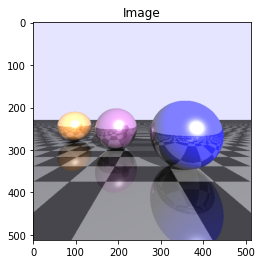

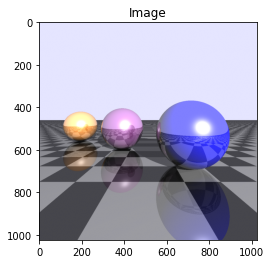

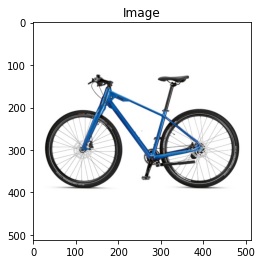

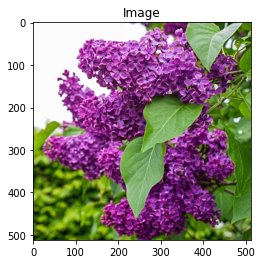

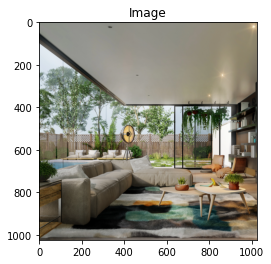

In [5]:
rt = get_img('https://i.imgur.com/Fjq9e7C.png') #raytraced 512x512
rtHD = get_img('https://i.imgur.com/uDbcPXZ.png') #raytraced 1024x1024
bike = get_img('https://i.imgur.com/3cx94pj.jpg') #bike 512x512
lilac = get_img('https://i.imgur.com/iOh18Q0.jpg')
room = get_img('https://i.imgur.com/ZTa0X1U.png') #room 1024x1024


network_size = (4, 256)
learning_rate = 1e-4
iters = 2000
mapping_size = 256

In [6]:
def get_test_data(image):
    image_x_test = get_x_test(image)
    return [image_x_test, image]

def embedding(sigma):
    return random.normal(rand_key, (256, 2))*sigma

def plot_comparison(model, truth, samples, msg):
    reconstructed = model[2]
    plt.figure(figsize=(16,8))
    plt.subplot(1,2,1)
    plt.imshow(truth)
    plt.title("Ground Truth")
    plt.subplot(1,2,2)
    plt.imshow(reconstructed)
    plt.title("Reconstructed with "+str(msg)+" (Samples: "+str(samples)+ ")")
    plt.show()
    print("TEST RMSE:  ", model[1])
    print("TRAIN RMSE: ", model[0])
    
def error_img_plot(model, truth, msg):
    error_img = numpy.mean(numpy.absolute(truth - model[2]), axis = 2)
    plt.figure(figsize=(16,16))
    plt.subplot(1,1,1)
    plt.imshow(error_img)
    plt.title(str(msg)+" error")
    plt.show()
    
    

# Low variance Image with Sharp Lines

sample distrib: [  516.03149606  1032.06299213  2064.12598425  4128.2519685
  8256.50393701 16513.00787402 33026.01574803]


train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

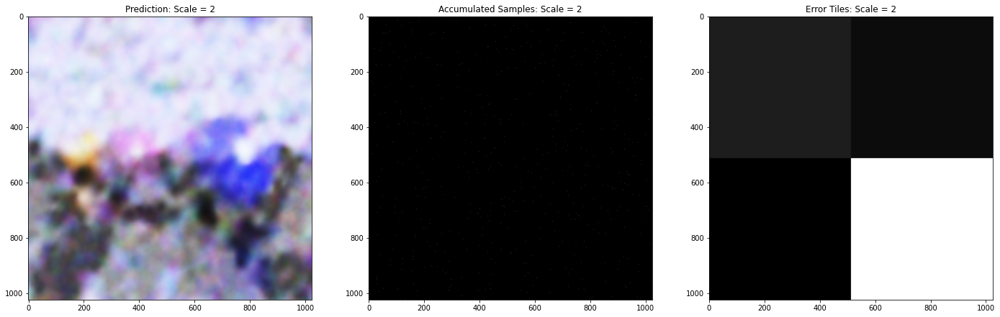

Current iteration:  250 Current scale:  4
Number of samples:  1540


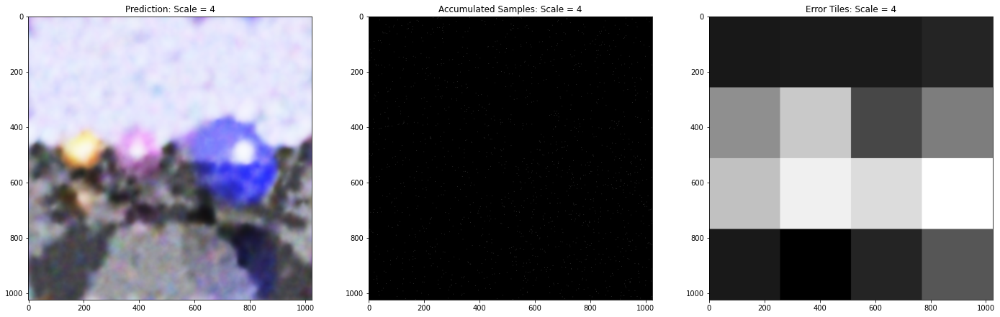

Current iteration:  500 Current scale:  8
Number of samples:  3568


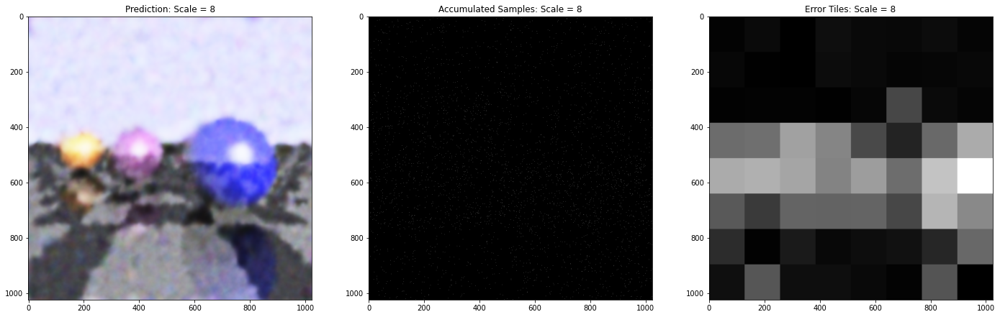

Current iteration:  750 Current scale:  16
Number of samples:  7572


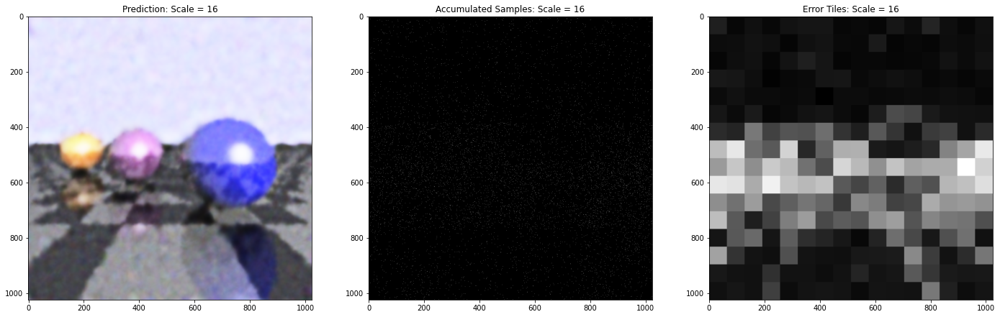

Current iteration:  1000 Current scale:  32
Number of samples:  15316


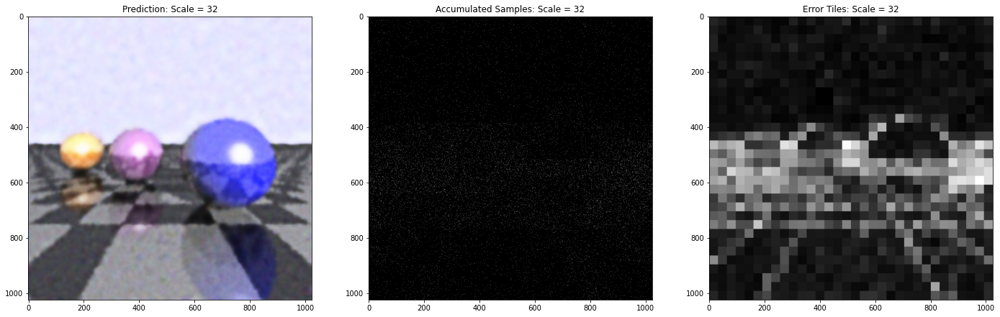

Current iteration:  1250 Current scale:  64
Number of samples:  29820


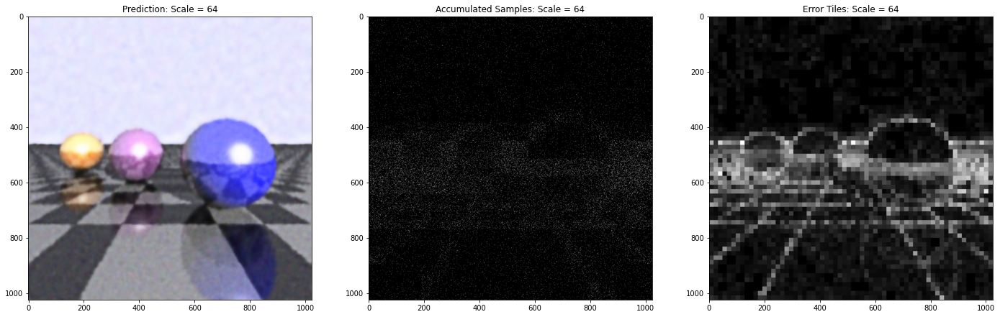

Current iteration:  1500 Current scale:  128
Number of samples:  56032


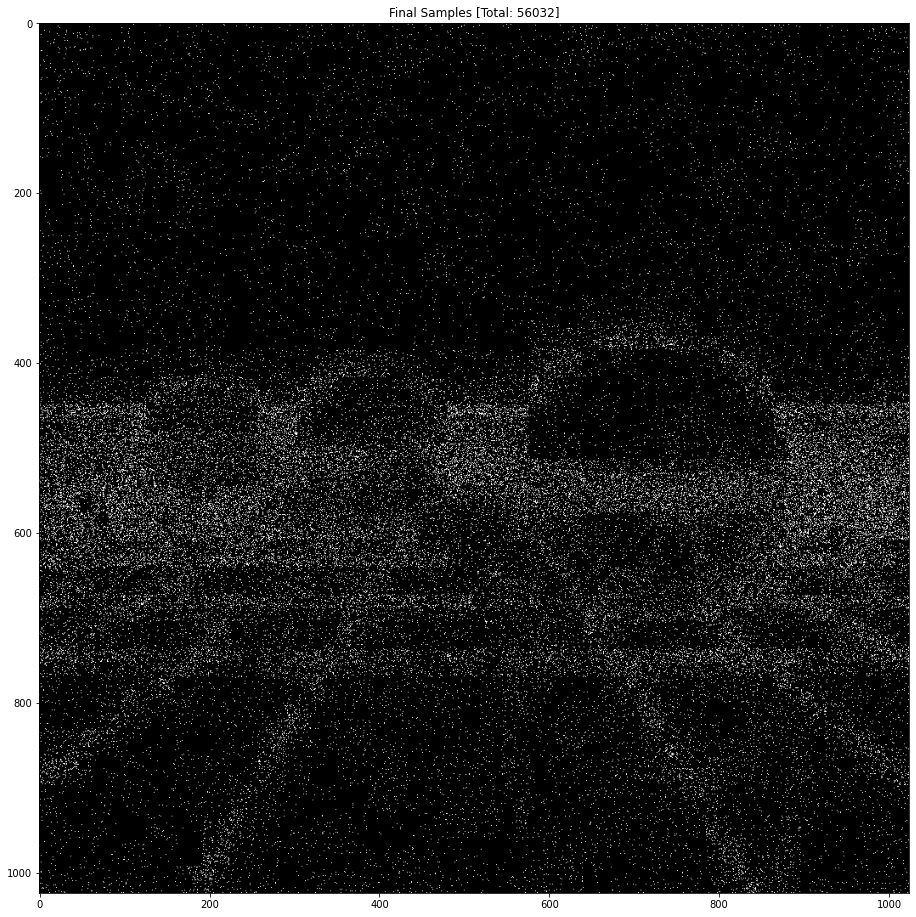

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

Random Sampling, no scale


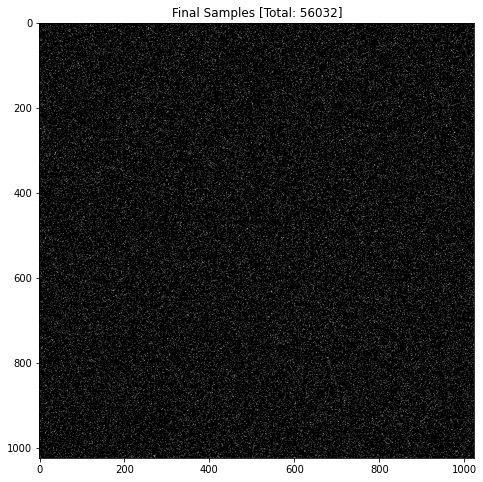

In [28]:
total_samples = 256*256
scales = 7
render_test_data = get_test_data(rtHD)

trainer = train_experimental(network_size, learning_rate, 250, embedding(4), render_test_data, 
                                           total_samples, scales, even_dist = False)
trained_model_test = train_final(network_size, learning_rate, iters, embedding(4), render_test_data, trainer[-1])

trained_model_test2 = train_no_scale(network_size, learning_rate, iters, embedding(4), render_test_data, 
                                           trainer[-1][0].shape[0])


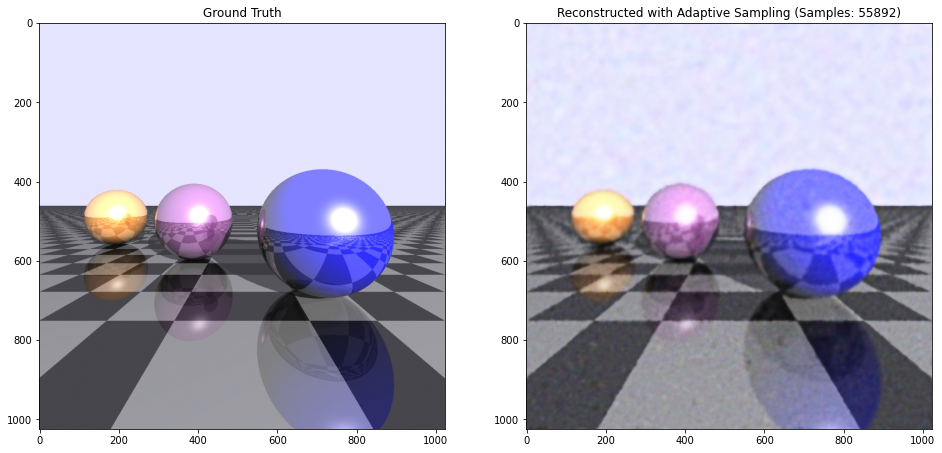

TEST RMSE:   0.033062503
TRAIN RMSE:  0.048940793


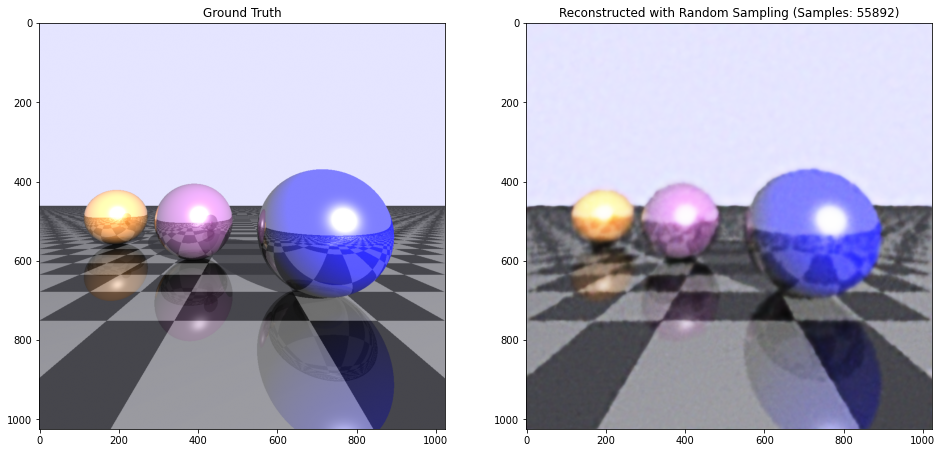

TEST RMSE:   0.037625436
TRAIN RMSE:  0.028699331


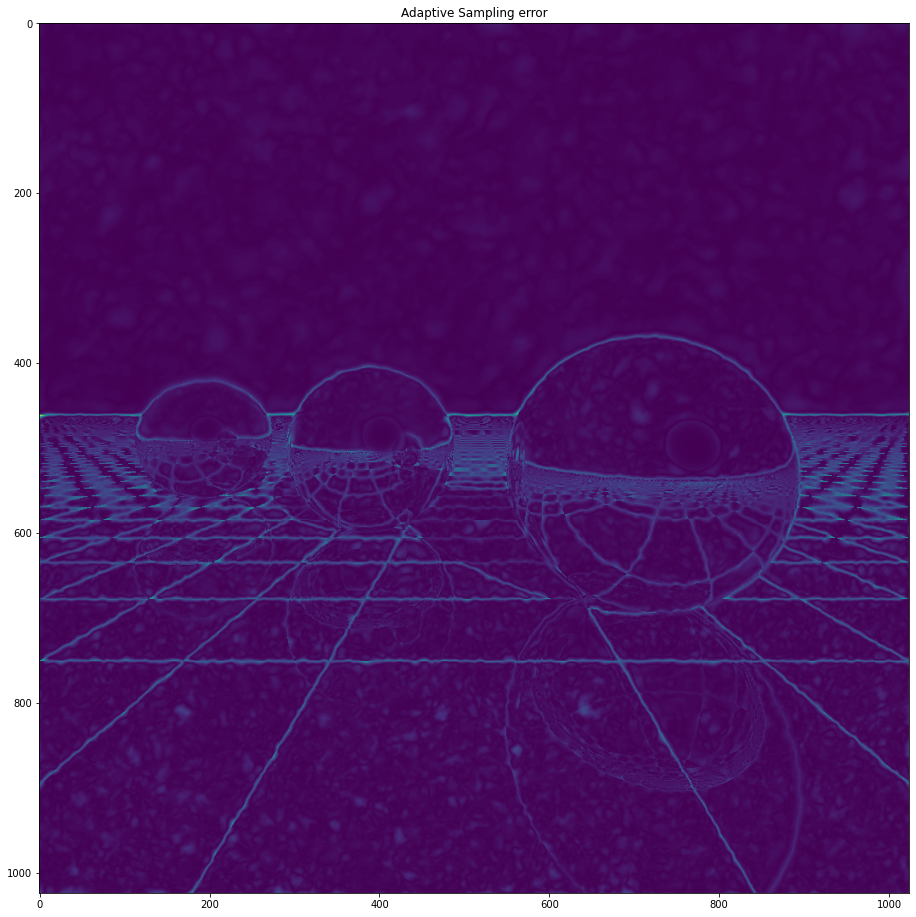

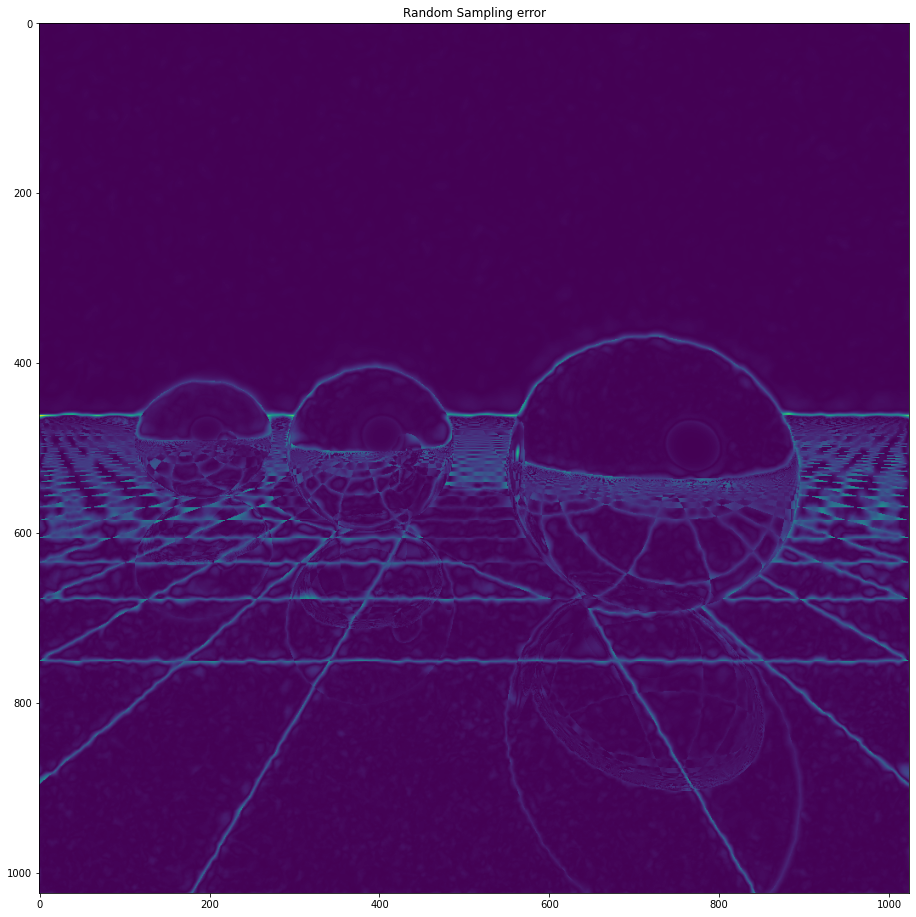

In [27]:
plot_comparison(trained_model_test, rtHD, trainer[-1][0].shape[0], "Adaptive Sampling")
plot_comparison(trained_model_test2, rtHD, trainer[-1][0].shape[0], "Random Sampling")
error_img_plot(trained_model_test, rtHD, "Adaptive Sampling")
error_img_plot(trained_model_test2, rtHD, "Random Sampling")

There are two things that I mainly gather from these experiments, and this first test shows them perfectly. First, the adaptive sampler is better at perserving hard edges and smaller details. This is what I expected. Second, it seems that an adaptive sampler that draws samples away from low variance areas of the image leads to a noisy reconstruction. The randomly sampled reconstructions are much smoother and actually look a lot better in some aspects. However, the adaptive sampler almost always wins out in reconstruction error despite more noise. If you look closely at the two reconstructions, you can see that edges and lines are much straighter when using adaptive sampling. Random sampling leads to 'wavy' edges with sparse samples. This test only uses about 6% of the pixels from the original image as samples (256x256/1024x1024) and we can see that adaptive sampling is better in this case because it allocates samples where they are needed. There is a cost of more noise, but this could be reduced by icreasing the first scale's sample count to sample more during the first scale. Denoising could also be applied.

# Complex Objects with Solid Background

One case where I think this adaptive sampler could shine would be when there is a lot of empty space in the scene/image. I test this with a 512x512 image of a bicycle on a white background below

sample distrib: [  634.92063492  1269.84126984  2539.68253968  5079.36507937
 10158.73015873 20317.46031746]


train iter:   0%|          | 0/1750 [00:00<?, ?it/s]

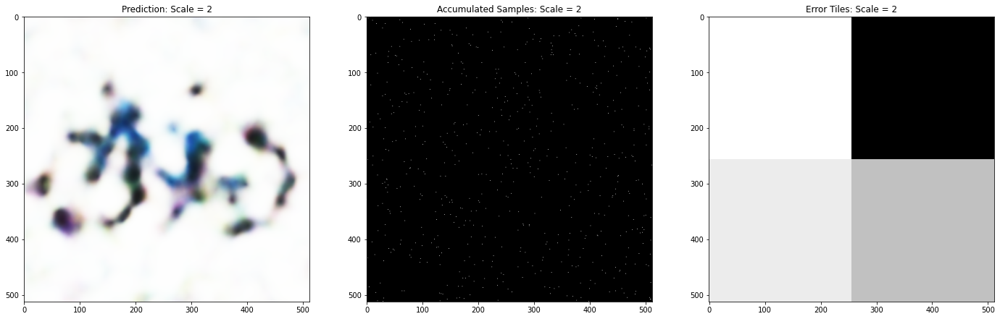

Current iteration:  250 Current scale:  4
Number of samples:  1896


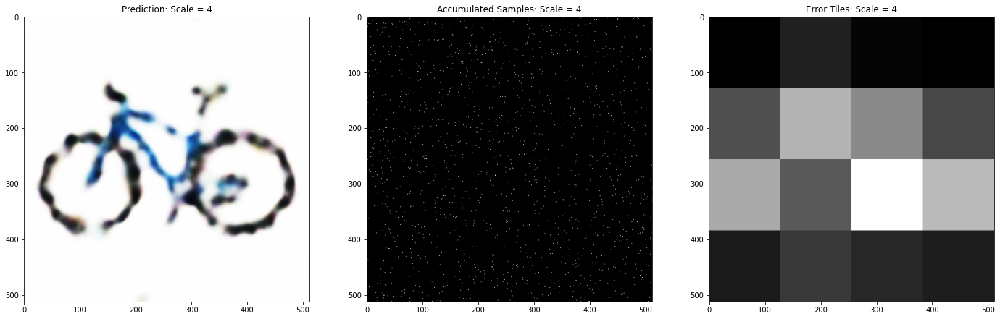

Current iteration:  500 Current scale:  8
Number of samples:  4408


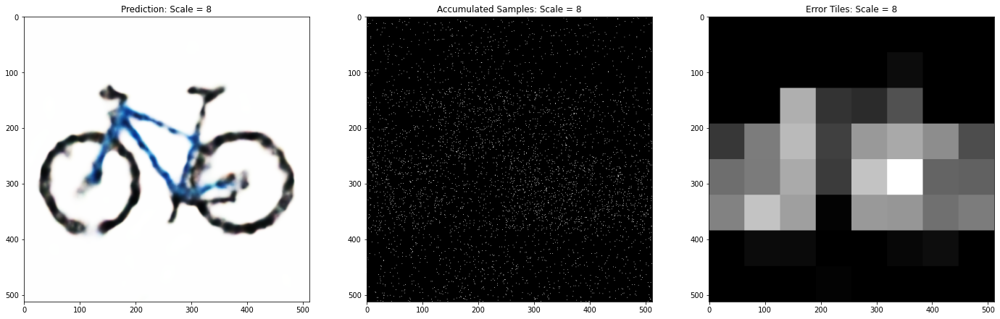

Current iteration:  750 Current scale:  16
Number of samples:  9420


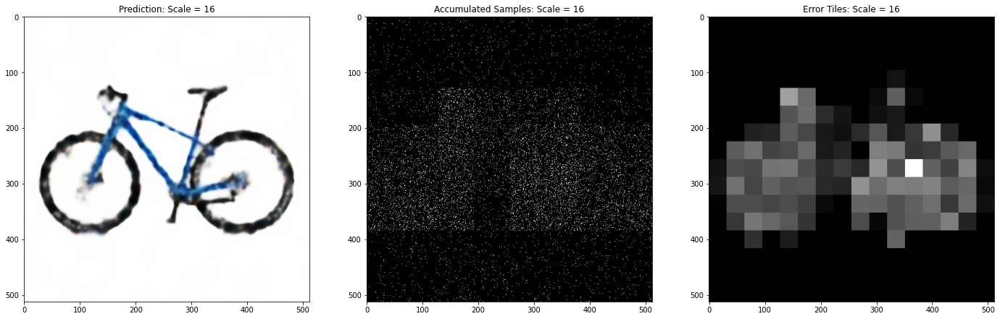

Current iteration:  1000 Current scale:  32
Number of samples:  19376


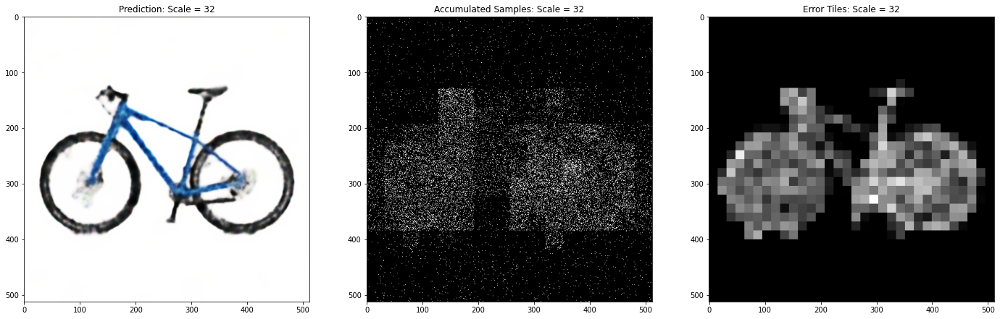

Current iteration:  1250 Current scale:  64
Number of samples:  39016


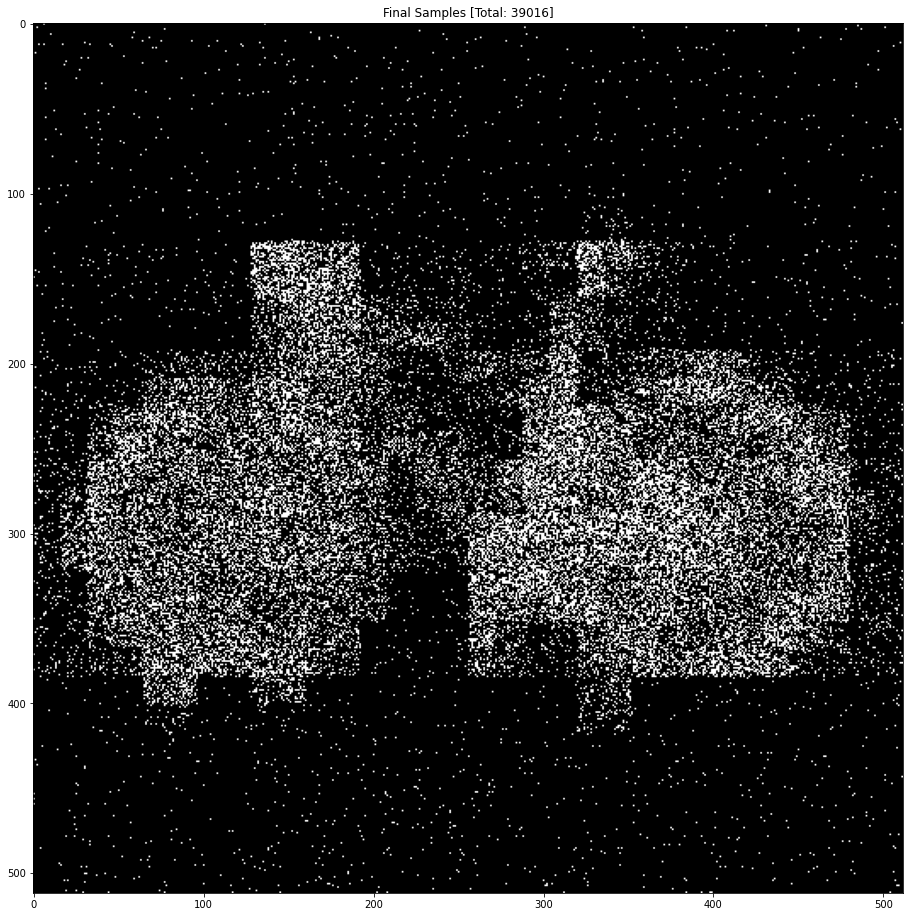

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

Random Sampling, no scale


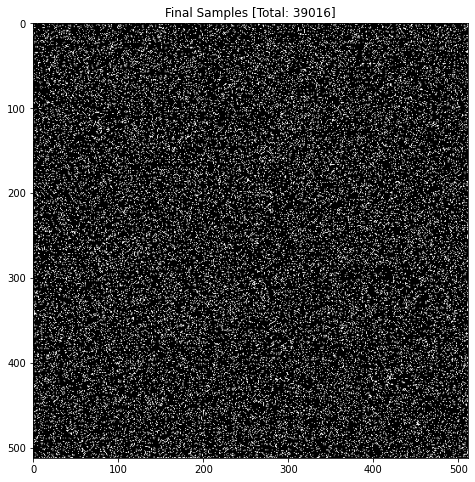

In [44]:
total_samples = 200*200
scales = 6
render_test_data = get_test_data(bike)

trainer = train_experimental(network_size, learning_rate, 250, embedding(4), render_test_data, 
                                           total_samples, scales, even_dist = False)
trained_model_test = train_final(network_size, learning_rate, iters, embedding(4), render_test_data, trainer[-1])

trained_model_test2 = train_no_scale(network_size, learning_rate, iters, embedding(4), render_test_data, 
                                           trainer[-1][0].shape[0])
#trainer = train_single_pass(network_size, learning_rate, 200, render_embedding, render_test_data, total_samples, 64, 0.7)
    

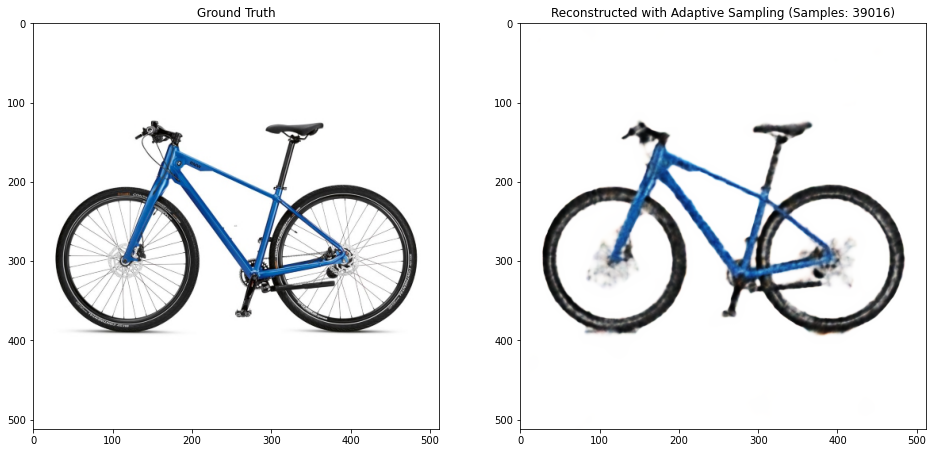

TEST RMSE:   0.05969682
TRAIN RMSE:  0.09022706


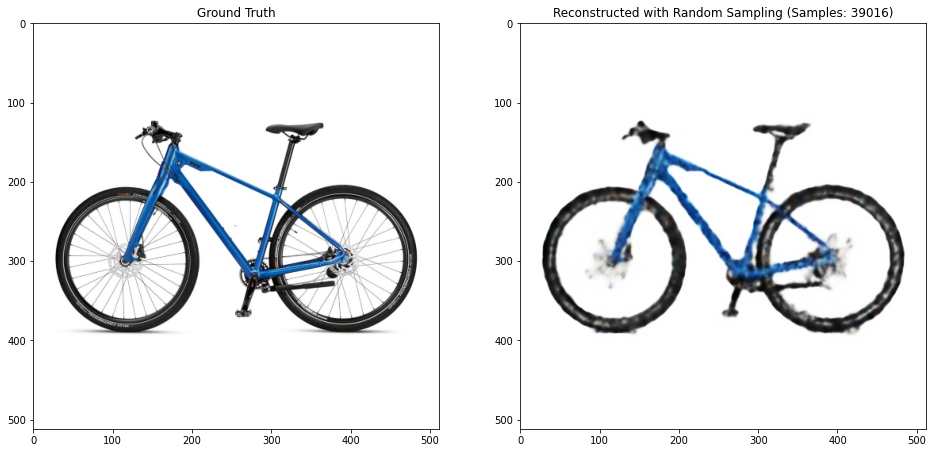

TEST RMSE:   0.06946376
TRAIN RMSE:  0.044689447


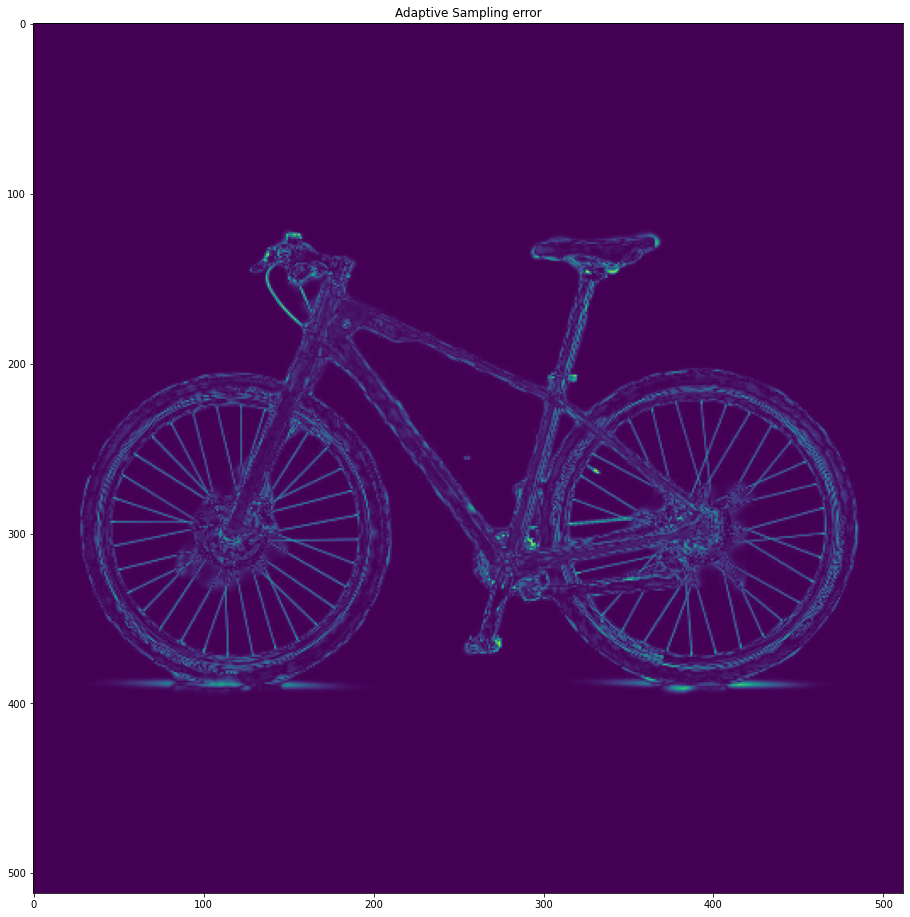

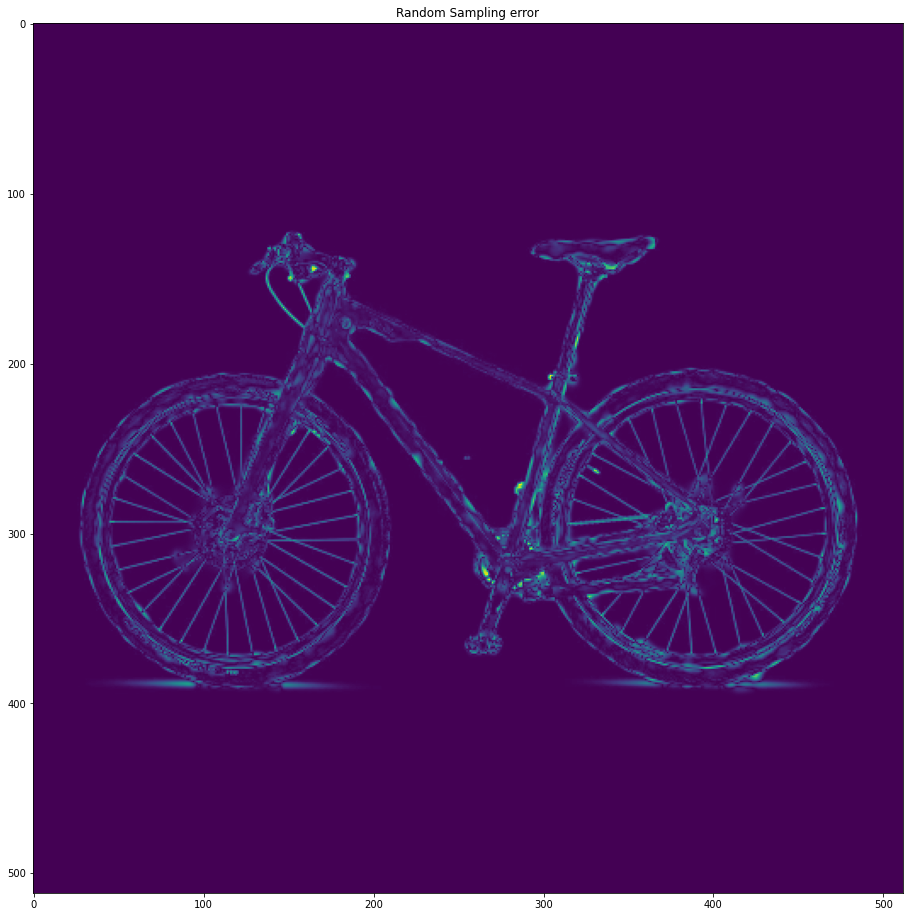

In [45]:
plot_comparison(trained_model_test, bike, trainer[-1][0].shape[0], "Adaptive Sampling")
plot_comparison(trained_model_test2, bike, trainer[-1][0].shape[0], "Random Sampling")
error_img_plot(trained_model_test, bike, "Adaptive Sampling")
error_img_plot(trained_model_test2, bike, "Random Sampling")

As expected, you can achieve cleaner edges and get rid of a lot of that wavy artifacting by using adaptive sampling. There is, however, a sweet spot for scaling. Using higher scales that divide the image into a grid of 128x128 leads to oversampling on some edges leading to missing portions of the bike.

# Single Scale Sampler

train data:  16384


train iter:   0%|          | 0/200 [00:00<?, ?it/s]

1.0


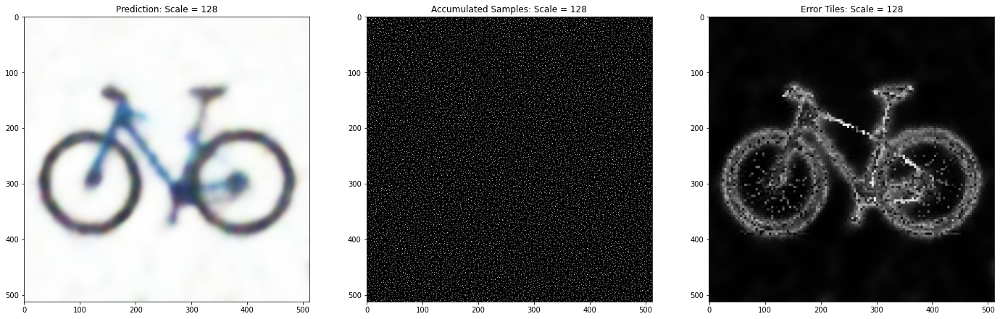

  0%|          | 0/128 [00:00<?, ?it/s]

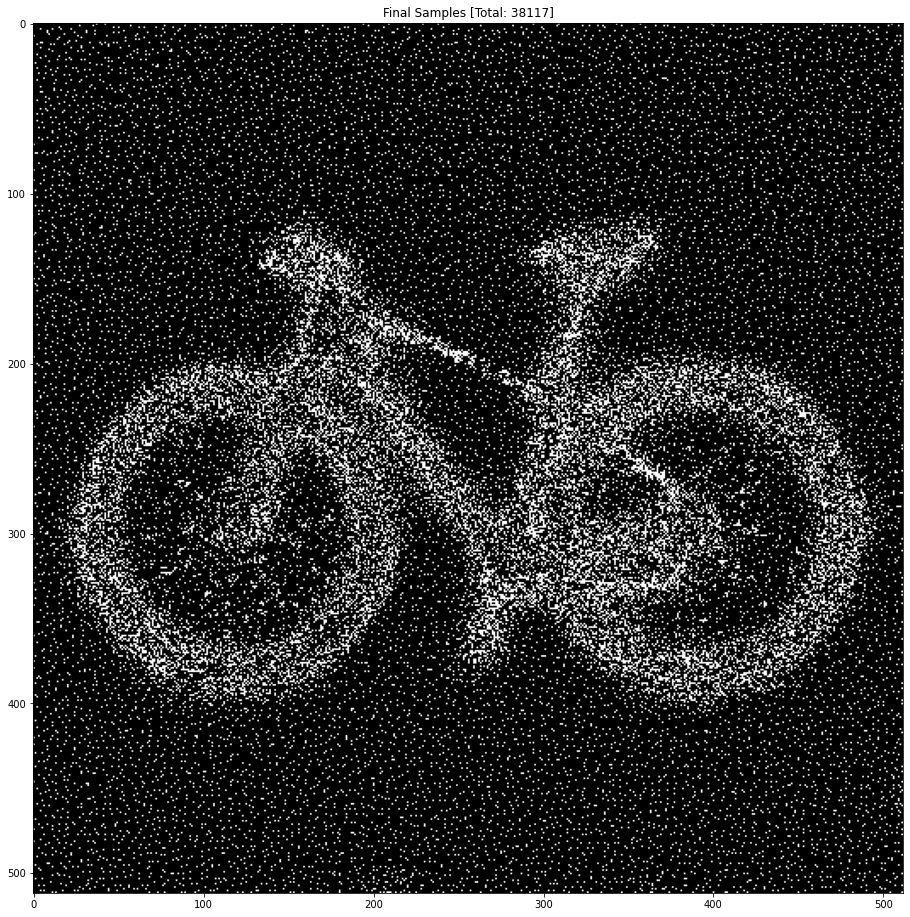

train data:  38117


train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

Random Sampling, no scale


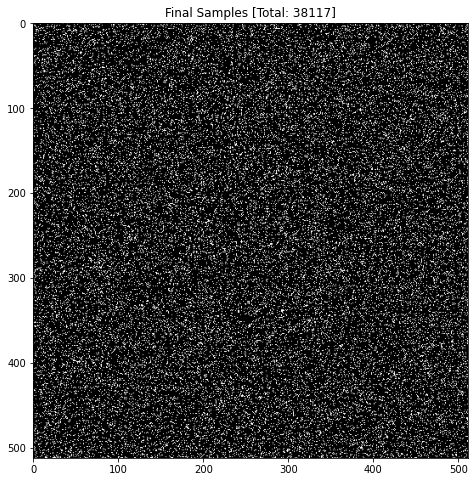

In [49]:
total_samples = 200*200
#scales = 6
render_test_data = get_test_data(bike)

#trainer = train_experimental(network_size, learning_rate, 250, embedding(4), render_test_data, 
#                                           total_samples, scales, even_dist = False)
trainer = train_single_pass(network_size, learning_rate, 200, embedding(4), render_test_data, total_samples, 128, 0.7)
trained_model_test = train_final(network_size, learning_rate, iters, embedding(4), render_test_data, trainer[-1])

trained_model_test2 = train_no_scale(network_size, learning_rate, iters, embedding(4), render_test_data, 
                                           trainer[-1][0].shape[0])

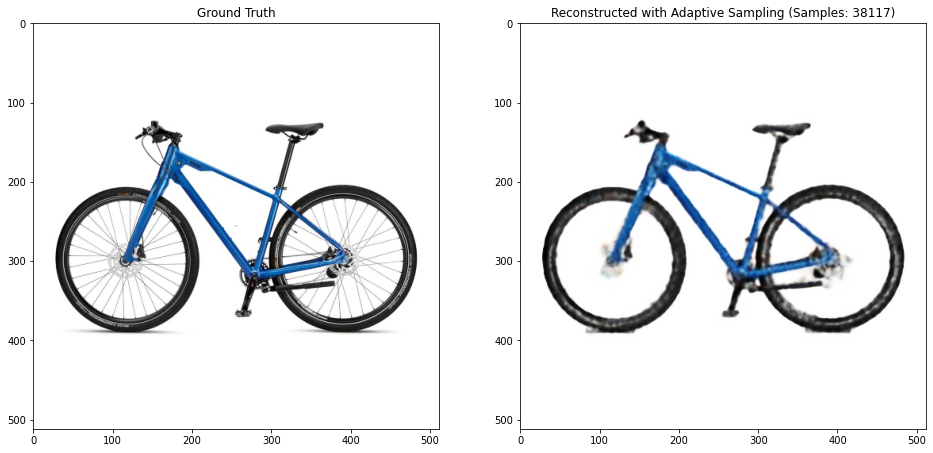

TEST RMSE:   0.059510898
TRAIN RMSE:  0.07476906


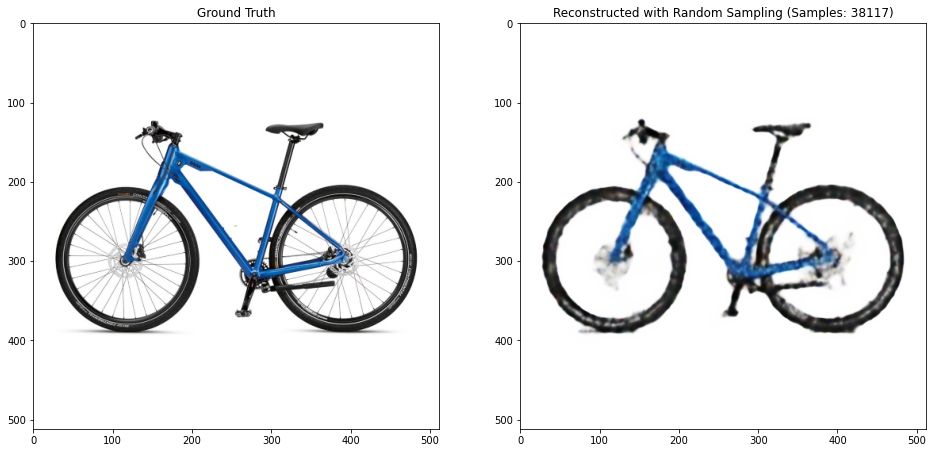

TEST RMSE:   0.070624314
TRAIN RMSE:  0.04375442


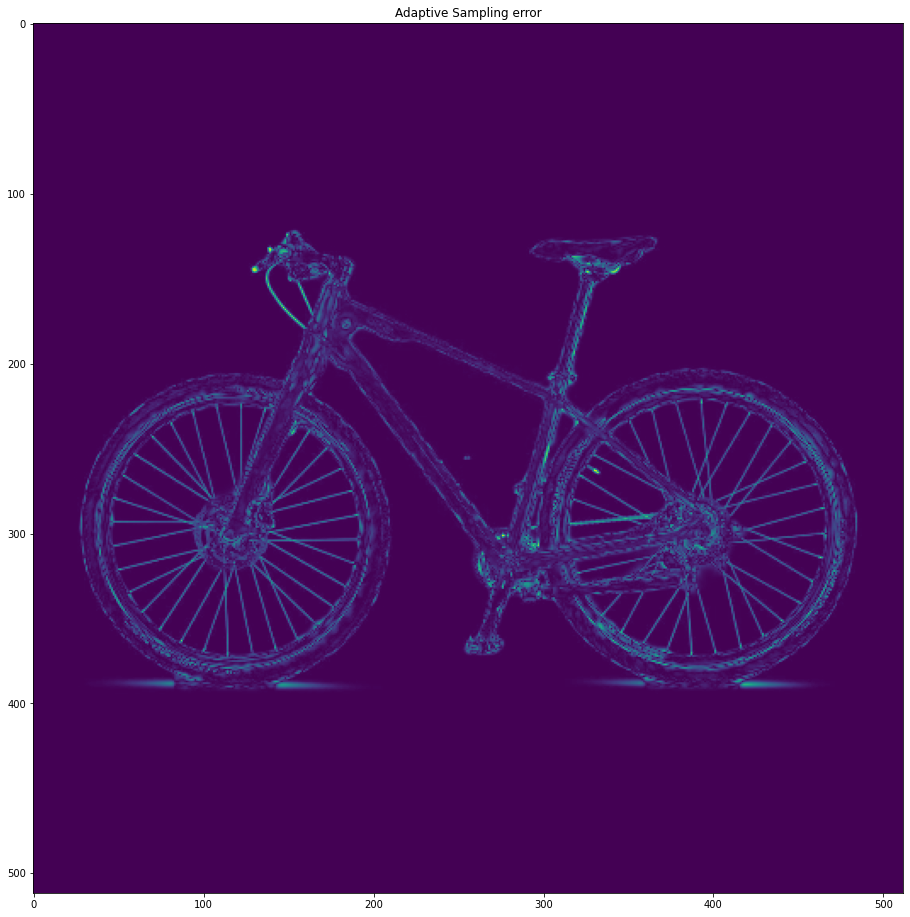

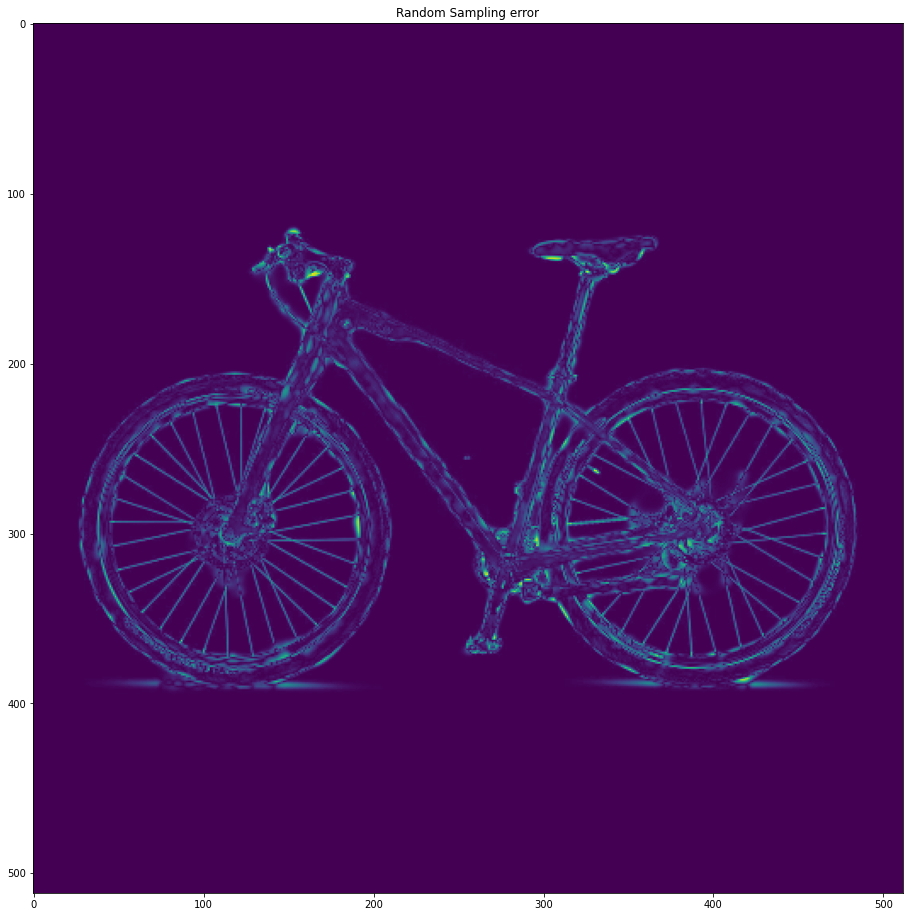

In [50]:
plot_comparison(trained_model_test, bike, trainer[-1][0].shape[0], "Adaptive Sampling")
plot_comparison(trained_model_test2, bike, trainer[-1][0].shape[0], "Random Sampling")
error_img_plot(trained_model_test, bike, "Adaptive Sampling")
error_img_plot(trained_model_test2, bike, "Random Sampling")

The single scale reconstruction above is actually slightly better than the multi-scale, but this is sometimes not the case in more complex scenes. You can see how samples are incredibly focused. This can lead to missing features in some cases or portions of the image being incredibly noisy. In this situation however it provides a very clean outline of the bike.

# Complex Scene

sample distrib: [  634.92063492  1269.84126984  2539.68253968  5079.36507937
 10158.73015873 20317.46031746]


train iter:   0%|          | 0/1750 [00:00<?, ?it/s]

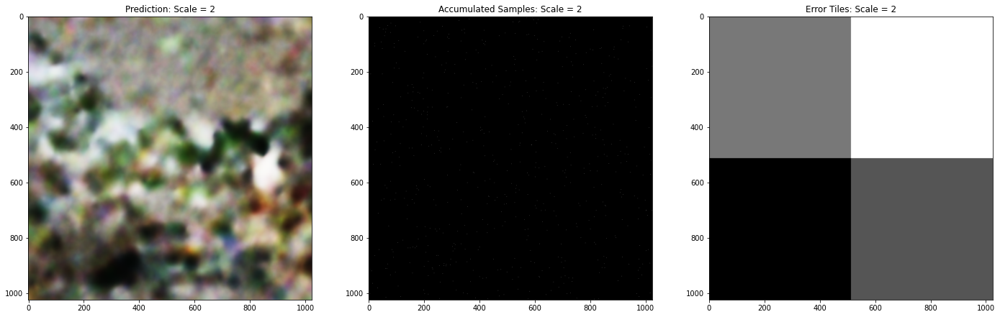

Current iteration:  250 Current scale:  4
Number of samples:  1892


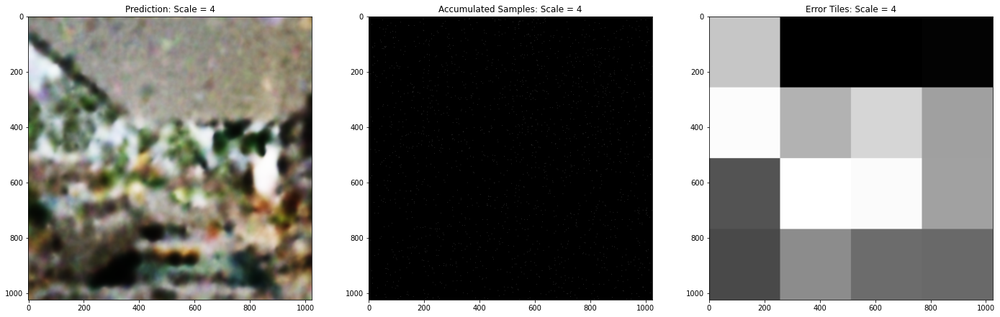

Current iteration:  500 Current scale:  8
Number of samples:  4396


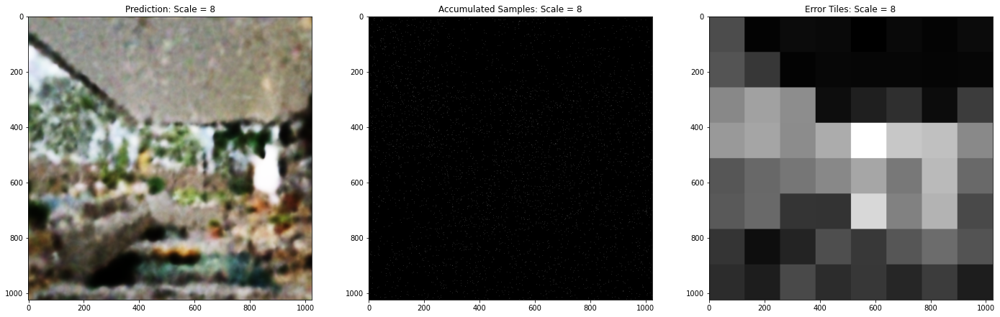

Current iteration:  750 Current scale:  16
Number of samples:  9352


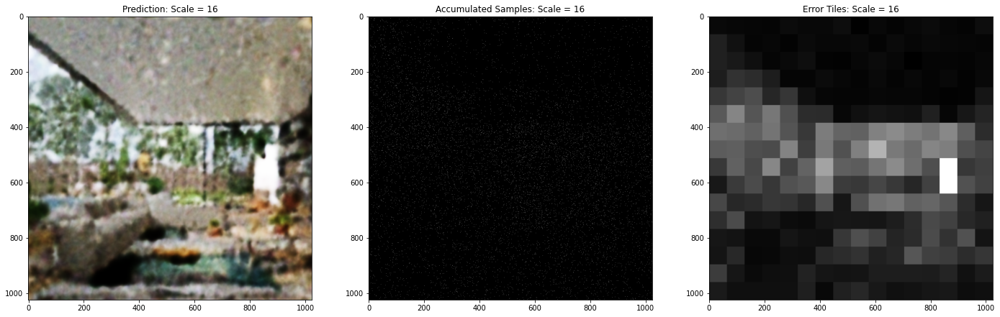

Current iteration:  1000 Current scale:  32
Number of samples:  18984


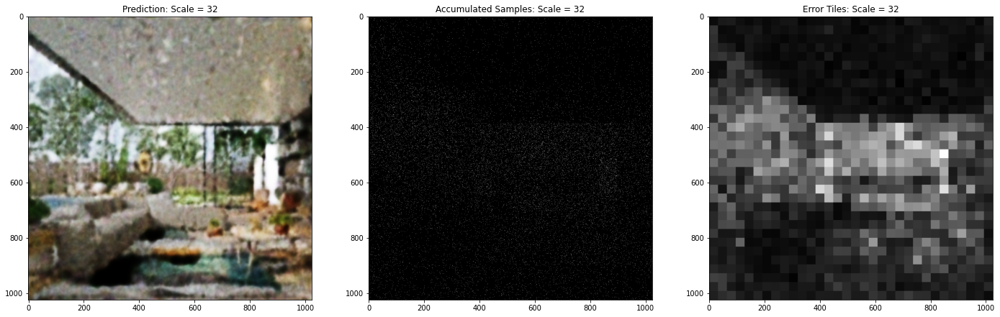

Current iteration:  1250 Current scale:  64
Number of samples:  37212


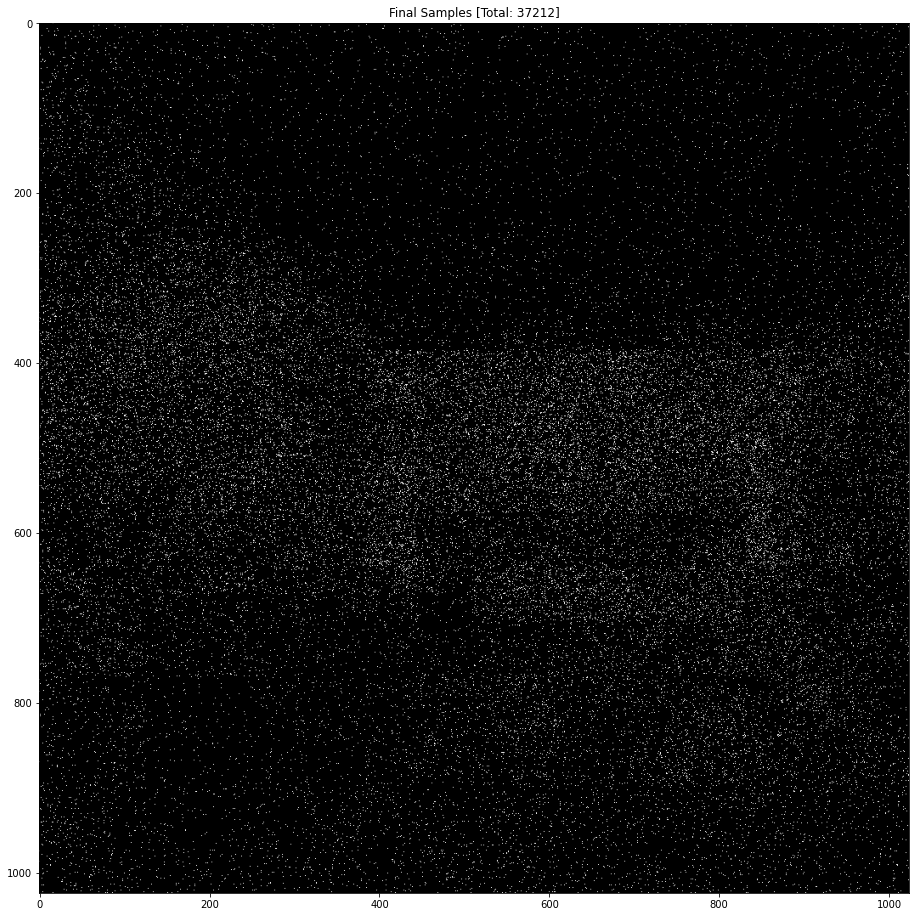

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

Random Sampling, no scale


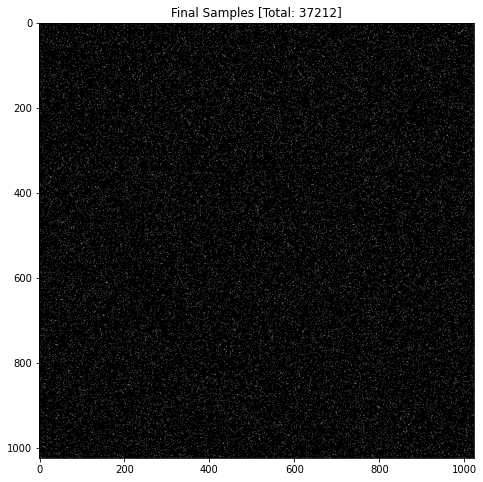

In [13]:
total_samples = 200*200
scales = 6
render_test_data = get_test_data(room)

trainer = train_experimental(network_size, learning_rate, 250, embedding(4), render_test_data, 
                                           total_samples, scales, even_dist = False)
trained_model_test = train_final(network_size, learning_rate, iters, embedding(4), render_test_data, trainer[-1])

trained_model_test2 = train_no_scale(network_size, learning_rate, iters, embedding(4), render_test_data, 
                                           trainer[-1][0].shape[0])
#trainer = train_single_pass(network_size, learning_rate, 200, render_embedding, render_test_data, total_samples, 64, 0.7)

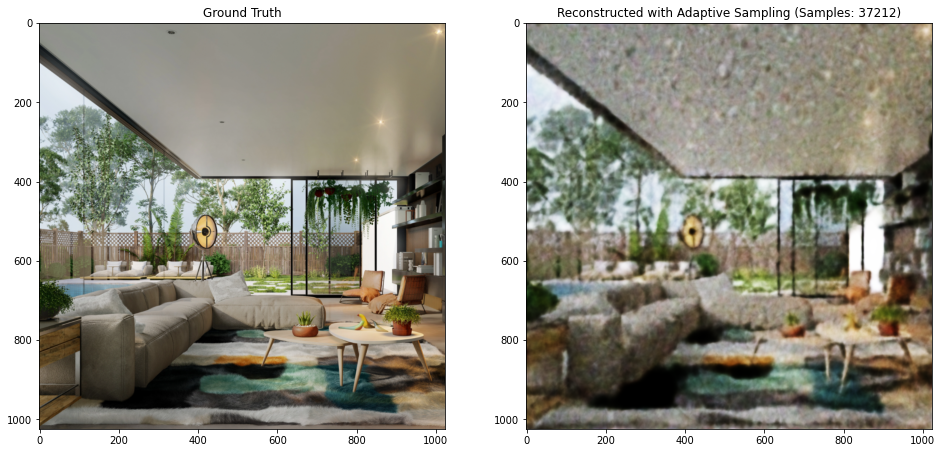

TEST RMSE:   0.077283114
TRAIN RMSE:  0.071215585


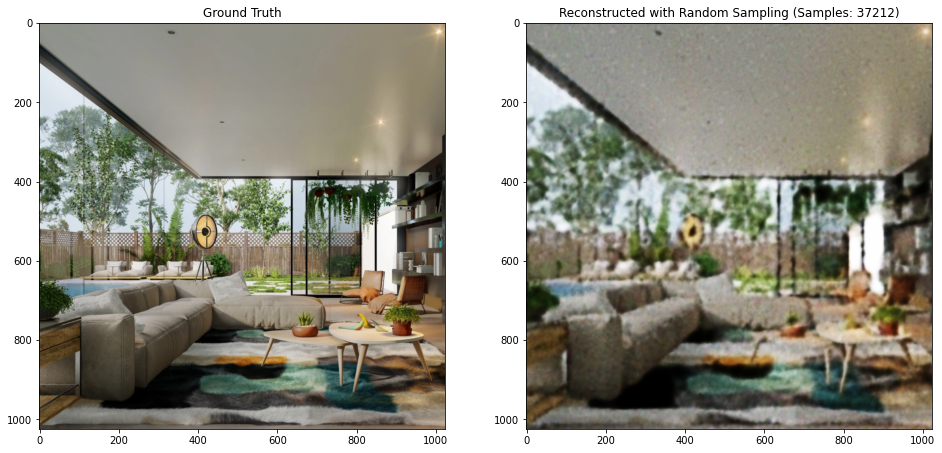

TEST RMSE:   0.0809618
TRAIN RMSE:  0.048158556


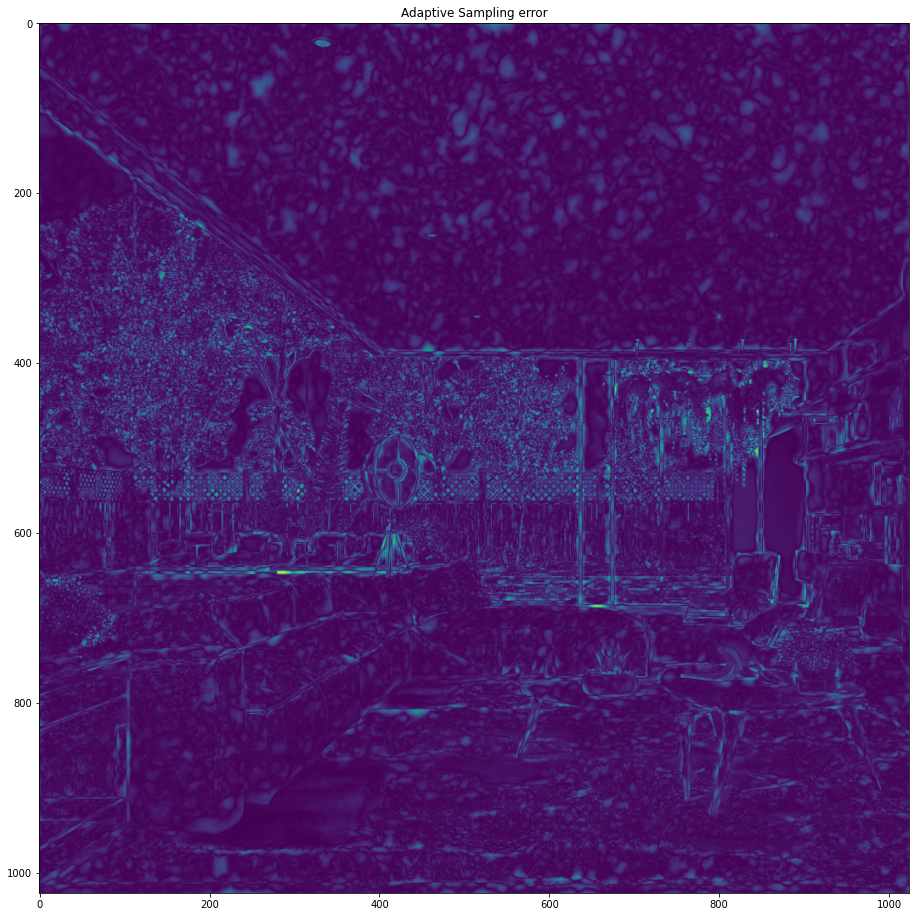

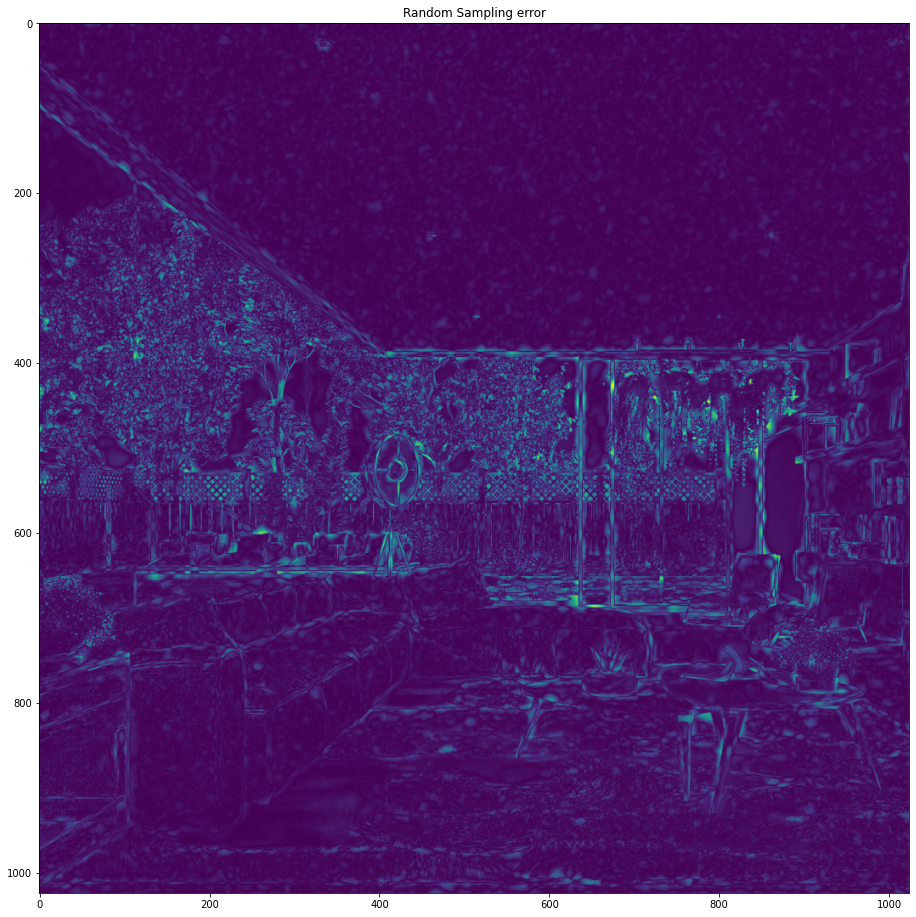

In [14]:
plot_comparison(trained_model_test, room, trainer[-1][0].shape[0], "Adaptive Sampling")
plot_comparison(trained_model_test2, room, trainer[-1][0].shape[0], "Random Sampling")
error_img_plot(trained_model_test, room, "Adaptive Sampling")
error_img_plot(trained_model_test2, room, "Random Sampling")

Finally this is a more complex scene, to show how it performs in comparison to a random sampler. One thing to note is that the adaptive sampler does poorly on the cieling, but does well on features like the thin doorframe.

# Conclusion
In conclusion, I think that adaptive sampling using a fourier feature mapping has potential in some cases. I don't believe this could be used in real time on current hardware unless vastly simplified. I think it would be worth exploring different mappings, sample distributions, and definitely worth trying this out with a ray tracer.

In [ ]:
# def get_rmse(truthImg, predImg, scale, block_idx_x, block_idx_y, errorImage):
#     block_size = int(truthImg.shape[0]/scale)
#     x_begin = int(block_size*block_idx_x)
#     y_begin = int(block_size*block_idx_y)
#     block_err = numpy.mean(numpy.absolute(truthImg[x_begin:x_begin+block_size, y_begin:y_begin+block_size]
#                                           - predImg[x_begin:x_begin+block_size, y_begin:y_begin+block_size]))
#     errorImage[x_begin:x_begin+block_size, y_begin:y_begin+block_size] = block_err
#     return block_err, errorImage

# def train_model_adsampler(network_size, learning_rate, iters, B, test_data, total_samples, scales):

#     init_fn, apply_fn = make_network(*network_size)

#     model_pred = jit(lambda params, x: apply_fn(params, input_mapping(x, B)))
#     model_loss = jit(lambda params, x, y: np.mean((model_pred(params, x) - y) ** 2))
#     model_rmse = jit(lambda params, x, y: np.sqrt(model_loss(params, x, y)))
#     model_grad_loss = jit(lambda params, x, y: jax.grad(model_loss)(params, x, y))

#     opt_init, opt_update, get_params = optimizers.adam(learning_rate)
#     opt_update = jit(opt_update)
    
#     sampleImage = numpy.zeros((render.shape[0], render.shape[0], 3))
#     #samples_per_scale = int(total_samples/scales)
#     sample_distrib = numpy.zeros(scales)
#     for x in range(scales):
#         sample_distrib[x] = 2**x
#     sample_distrib = (sample_distrib/numpy.sum(sample_distrib))*total_samples
    
#     #initial training data, sample from whole image
#     train_data, sampleImage = get_samples(test_data[1], 1, 0, 0, int(sample_distrib[0]),sampleImage)

#     _, params = init_fn(rand_key, (-1, input_mapping(train_data[0], B).shape[-1]))
#     opt_state = opt_init(params)
    
#     iter_per_scale = int(iters/scales)
#     for i in tqdm(range(iters), desc='train iter', leave=False):
#         if (int((i/iter_per_scale)) == scales):
#             break
#         if (i%iter_per_scale == 0 and i != 0):
#             scale = 2**(int((i/iter_per_scale)))
#             pred_img = model_pred(get_params(opt_state), test_data[0])
#             errorImage = numpy.zeros((render.shape[0], render.shape[0]))
#             berrs = numpy.zeros((scale,scale))
#             for bx in range(scale):
#                 for by in range(scale):
#                     berr, errorImage = get_rmse(test_data[1], pred_img, scale, bx, by, errorImage)
#                     berrs[bx][by] = berr
#             berrs = berrs/numpy.sum(berrs)
#             block_samples = berrs*sample_distrib[int((i/iter_per_scale))]
#             for bx in range(scale):
#                 for by in range(scale):
#                     new_train, sampleImage = get_samples(test_data[1], scale, bx, by, int(block_samples[bx][by]), sampleImage)
#                     train_data = [numpy.append(train_data[0],new_train[0],axis=0), numpy.append(train_data[1],new_train[1],axis=0)]
#             print("iteration: ",i,"scale: ",scale)
#             print("train data: ", train_data[0].shape[0])
            
            
            
#             plot_imgs(pred_img, sampleImage, errorImage, scale)
            

            
#         opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *train_data), opt_state)
        
#     #for i in tqdm(range(2000), desc='train iter', leave=False):
#     #    opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *train_data), opt_state)
        

        
        
#     train_rmse = model_rmse(get_params(opt_state), *train_data)
#     test_rmse = model_rmse(get_params(opt_state), *test_data)
#     pred_img = model_pred(get_params(opt_state), test_data[0])
    

    
#     return [train_rmse, test_rmse, pred_img, train_data]